<div style="background-color: #8B4513; color: #e6f7ff; padding: 20px; border-radius: 10px; text-align: center;">
  <h2>Soybean Oil Price Prediction</h2>
</div>



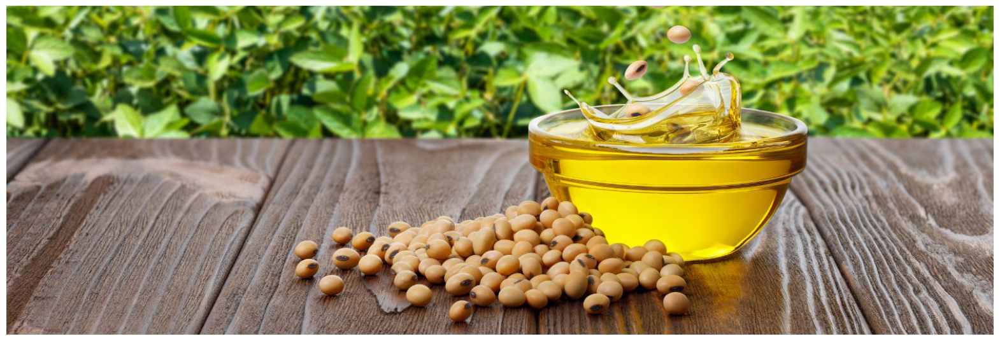

In [3]:

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

image = mpimg.imread('soybean-oil-with-soybeans-on-table.jpg')


plt.figure(figsize=(20, 20))  
plt.imshow(image)
plt.axis('off')  
plt.show()



<div style="background-color: #B8860B; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>Introduction:</h2>
  <h3>
    For this project, the price-related data was gathered from Yahoo Finance. This data includes soybean oil prices from 2000 to 2021. To gain valuable insights into market trends, momentum, and potential price reversals, technical indicators were calculated from existing price data. 
    Because soybean oil prices can be affected by a wide range of factors like supply-demand dynamics and macroeconomic changes, I also gathered global macroeconomic data from 2000 to 2021 from the World Bank and world supply-demand data for soybean oil from the U.S. Department of Agriculture.
</p>
  <p>
  
After gathering all these important factors that can affect future oil prices and cleaning the data, I conducted EDA to understand the market trends and the effects of different features on oil prices.
  </p>
  <p>
    In the last step, I trained an LSTM model. This is a very powerful recurrent neural network model because it can memorize all the insights from previous data points and combine these insights with the analysis of subsequent data points. I trained my model with data from 2000 to 2020. Based on this 20 years of historical data, my model predicts oil prices in 2021.
  </p>
</div>
>
</div>


<div style="background-color:  #B8860B ; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>Step 1 | Setup and Gathering data </h2>
</div>


<div style="background-color: #DAA520; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>1.1 Importing Necessary Libraries</h2>
</div>

In [4]:

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import colors as mcolors
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_percentage_error
import tensorflow as tf
from keras import Model
from keras.layers import Input, Dense, Dropout
from keras.layers import LSTM

2024-08-24 09:15:25.484346: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
!pip install pandas_ta


<div style="background-color: #DAA520; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>1.2 Loading Historical Price Data</h2>
</div>

In [6]:
price_df = pd.read_csv("Soybean Oil.csv")
price_df.head(10)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2000-03-15,17.049999,17.129999,16.809999,16.850000,16.850000,11147.0
1,2000-03-16,16.790001,17.219999,16.639999,16.940001,16.940001,12610.0
2,2000-03-17,17.100000,17.900000,17.000000,17.850000,17.850000,24579.0
3,2000-03-20,17.500000,17.600000,17.260000,17.459999,17.459999,10960.0
4,2000-03-21,17.430000,17.459999,17.219999,17.270000,17.270000,8102.0
5,2000-03-22,17.370001,17.580000,17.350000,17.500000,17.500000,13603.0
6,2000-03-23,17.450001,17.459999,17.080000,17.160000,17.160000,11334.0
7,2000-03-24,17.139999,17.500000,17.000000,17.400000,17.400000,7382.0
8,2000-03-27,17.350000,17.700001,17.350000,17.600000,17.600000,5908.0
9,2000-03-28,17.600000,17.700001,17.459999,17.500000,17.500000,7022.0


In [7]:
missing_values = price_df.isna().sum()
missing_values

Date           0
Open         205
High         205
Low          205
Close        205
Adj Close    205
Volume       205
dtype: int64

In [8]:

price_df['Date'] = pd.to_datetime(price_df['Date'], errors='coerce')


columns_with_missing = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']

# Forward Fill Imputation
price_df[columns_with_missing] = price_df[columns_with_missing].ffill()



In [9]:
missing_values = price_df.isna().sum()
missing_values

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [10]:
# Check for duplicate rows based on all columns
duplicates_all_columns = price_df.duplicated()


total_duplicates_all_columns = duplicates_all_columns.sum()
print(f"Total number of duplicate rows (based on all columns): {total_duplicates_all_columns}")

Total number of duplicate rows (based on all columns): 0


<div style="background-color: #B8860B ; color: #e6f7ff ; padding: 20px; border-radius: 10px;">
  <h2>why we need to enrich our data?</h2>
  <h3>Historical price data helps in price prediction by providing a foundation for understanding past trends, patterns, and behaviors in the market. This data is crucial for identifying price cycles, volatility, and support/resistance levels, which can be used to forecast future price movements.

<h3>However, relying solely on historical price data is often not enough for robust prediction because historical prices don't provide information about the underlying factors driving those prices, such as changes in supply and demand, economic indicators, or geopolitical events. Therefore, to ensure robust model predictions, we need to enrich our data with additional relevant features that capture these driving factors.
</h3>
</div>

<div style="background-color: #DAA520; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>1.3 Include Technical Indicators</h2>
</div>

<div style="background-color: #B8860B; color: #e6f7ff; padding: 20px; border-radius: 10px; font-size: 18px; line-height: 1.6;">
  <h2 style="font-size: 22px; margin-bottom: 20px;">To gain valuable insights into market trends, momentum, and potential price reversals, we will derive several key technical indicators from historical price data. These indicators help in understanding the underlying market conditions and making informed predictions:</h2>
  
  <ul style="margin-top: 20px;">
    <li><b>Moving Averages (SMA, EMA):</b>
      <ul style="margin-top: 10px;">
        <li><b>Simple Moving Average (SMA):</b> Calculates the average of a security's price over a specific number of periods, smoothing out price data to identify trends.</li>
        <li style="margin-top: 5px;"><b>Exponential Moving Average (EMA):</b> Similar to SMA but gives more weight to recent prices, making it more responsive to new information.</li>
      </ul>
    </li>
    <li style="margin-top: 15px;"><b>Relative Strength Index (RSI):</b>
      A momentum oscillator that measures the speed and change of price movements. RSI helps identify overbought or oversold conditions, which may indicate potential trend reversals.</li>
    <li style="margin-top: 15px;"><b>Bollinger Bands:</b>
      A volatility indicator that plots two standard deviations away from a simple moving average of the price. Bollinger Bands highlight periods of high and low volatility and potential price breakouts.</li>
    <li style="margin-top: 15px;"><b>MACD (Moving Average Convergence Divergence):</b>
      This indicator shows the relationship between two moving averages of a security’s price. It helps to identify changes in momentum, which may precede significant market movements.</li>
    <li style="margin-top: 15px;"><b>On-Balance Volume (OBV):</b>
      A volume-based indicator that adds or subtracts volume on up days and down days, respectively. OBV helps confirm trends by comparing volume flow to price movement.</li>
  </ul>
</div>




In [11]:

price_tech_df = price_df.copy()


In [12]:
import pandas_ta as ta



In [13]:
# Simple Moving Average (SMA)
price_tech_df['SMA'] = ta.sma(price_tech_df['Close'], length=20)

# Exponential Moving Average (EMA)
price_tech_df['EMA'] = ta.ema(price_tech_df['Close'], length=20)

# Relative Strength Index (RSI)
price_tech_df['RSI'] = ta.rsi(price_tech_df['Close'], length=14)

# Bollinger Bands
bbands = ta.bbands(price_tech_df['Close'], length=20, std=2)
price_tech_df['BBL_20_2.0'] = bbands['BBL_20_2.0']
price_tech_df['BBM_20_2.0'] = bbands['BBM_20_2.0']
price_tech_df['BBU_20_2.0'] = bbands['BBU_20_2.0']

# Moving Average Convergence Divergence (MACD)
macd = ta.macd(price_tech_df['Close'])
price_tech_df['MACD'] = macd['MACD_12_26_9']
price_tech_df['MACD_signal'] = macd['MACDs_12_26_9']
price_tech_df['MACD_hist'] = macd['MACDh_12_26_9']

# On-Balance Volume (OBV)
price_tech_df['OBV'] = ta.obv(price_tech_df['Close'], price_tech_df['Volume'])


In [14]:
price_tech_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5411 entries, 0 to 5410
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         5411 non-null   datetime64[ns]
 1   Open         5411 non-null   float64       
 2   High         5411 non-null   float64       
 3   Low          5411 non-null   float64       
 4   Close        5411 non-null   float64       
 5   Adj Close    5411 non-null   float64       
 6   Volume       5411 non-null   float64       
 7   SMA          5392 non-null   float64       
 8   EMA          5392 non-null   float64       
 9   RSI          5397 non-null   float64       
 10  BBL_20_2.0   5392 non-null   float64       
 11  BBM_20_2.0   5392 non-null   float64       
 12  BBU_20_2.0   5392 non-null   float64       
 13  MACD         5386 non-null   float64       
 14  MACD_signal  5378 non-null   float64       
 15  MACD_hist    5378 non-null   float64       
 16  OBV   

In [15]:
# Apply backward fill 
price_tech_df = price_tech_df.fillna(method='bfill')



In [16]:
price_tech_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5411 entries, 0 to 5410
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         5411 non-null   datetime64[ns]
 1   Open         5411 non-null   float64       
 2   High         5411 non-null   float64       
 3   Low          5411 non-null   float64       
 4   Close        5411 non-null   float64       
 5   Adj Close    5411 non-null   float64       
 6   Volume       5411 non-null   float64       
 7   SMA          5411 non-null   float64       
 8   EMA          5411 non-null   float64       
 9   RSI          5411 non-null   float64       
 10  BBL_20_2.0   5411 non-null   float64       
 11  BBM_20_2.0   5411 non-null   float64       
 12  BBU_20_2.0   5411 non-null   float64       
 13  MACD         5411 non-null   float64       
 14  MACD_signal  5411 non-null   float64       
 15  MACD_hist    5411 non-null   float64       
 16  OBV   

In [17]:
# Check for duplicate rows based on all columns
duplicates_all_columns = price_tech_df.duplicated()


total_duplicates_all_columns = duplicates_all_columns.sum()
print(f"Total number of duplicate rows (based on all columns): {total_duplicates_all_columns}")


Total number of duplicate rows (based on all columns): 0


<div style="background-color: #DAA520; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>1.4 Include Supply-Demand Data</h2>
</div>

In [18]:
supply_df = pd.read_csv("soybean oil pro-con 2000-2021.csv", sep=';', engine='python')
supply_df.head(10)

,year,Crush,ExtractRate,Production,Imports,Exports,Total-Cons,Food-Use,Feed-Use,Ending-stock,Country-Region
0,2000,380,"17,4",66,143,7,204,136,1,15,Europe
1,2000,518,"15,6",81,210,-,297,226,-,14,Sovit Union
2,2000,2.121,"16,6",352,2.016,121,2.244,2.158,32,27,NorthAfrica+MidEast
3,2000,18.600,"18,4",3.430,-,3.300,110,105,-,51,Argentina
4,2000,22.400,"19,1",4.275,250,1.450,3.060,2.850,-,225,Brazil
5,2000,18.670,"16,4",3.070,80,50,3.210,3.210,-,170,China
6,2000,310,"16,5",51,350,-,401,391,-,-,Egypt
7,2000,4.525,18,815,1.400,-,2.215,2.215,-,-,India
8,2000,745,"16,4",122,920,95,947,947,-,-,Iran
9,2000,4.450,"17,1",760,70,10,821,815,6,4,Mexico


In [19]:
columns_to_replace = ['  Imports ', '  Exports ', '    Feed-Use ', ' Ending-stock ']


supply_df[columns_to_replace] = supply_df[columns_to_replace].replace('-', np.nan)


supply_df[columns_to_replace] = supply_df[columns_to_replace].apply(pd.to_numeric, errors='coerce')

print(supply_df.isna().sum())


year                  0
    Crush             0
   ExtractRate        0
  Production          0
  Imports            13
  Exports            27
 Total-Cons           0
     Food-Use         0
    Feed-Use        126
 Ending-stock        37
Country-Region        0
dtype: int64


In [20]:

supply_df.columns = supply_df.columns.str.strip()

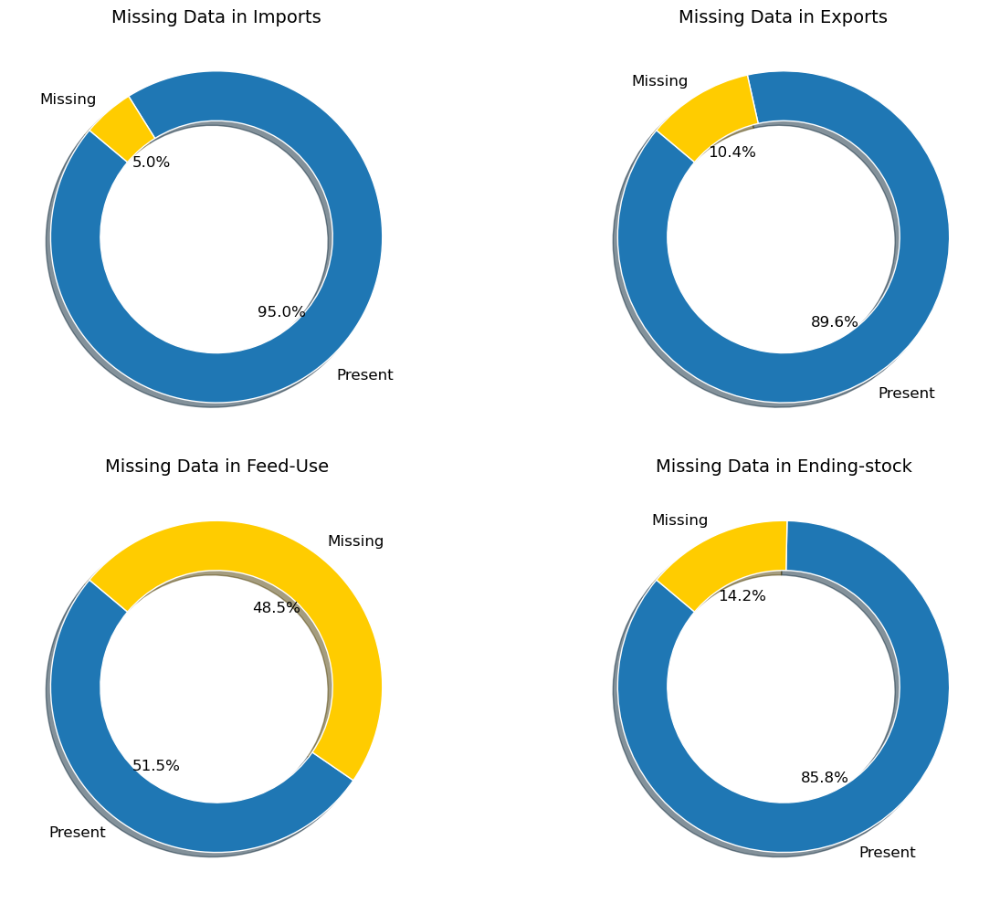

In [21]:

columns_of_interest = ['Imports', 'Exports', 'Feed-Use', 'Ending-stock']


missing_percentages = supply_df[columns_of_interest].isna().mean() * 100


fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.ravel()  

for i, col in enumerate(columns_of_interest):
    if col not in supply_df.columns:
        print(f"Column {col} not found in DataFrame.")
        continue

    
    data = [100 - missing_percentages[col], missing_percentages[col]]
    labels = ['Present', 'Missing']
    colors = ['#1f77b4', '#ffcc00']  

    
    wedges, texts, autotexts = axes[i].pie(
        data,
        labels=labels,
        colors=colors,
        autopct='%1.1f%%',  
        startangle=140,
        shadow=True,  
        wedgeprops=dict(width=0.3, edgecolor='w')  
    )
    
    
    for text in texts:
        text.set_fontsize(12)
    for autotext in autotexts:
        autotext.set_fontsize(12)
        autotext.set_color('black')  

    
    axes[i].set_title(f'Missing Data in {col}', fontsize=14)


plt.tight_layout()
plt.show()


<div style="background-color: #B8860B ; color: #e6f7ff ; padding: 20px; border-radius: 10px;">
  <h3>We have missing values in our dataset with the following proportions: Imports has 5% missing, Exports has 10.4% missing, Ending-stock has 14.2% missing, and Feed-Use has 48.5% missing. Due to the significant percentage of missing data in the Feed-Use column, we will drop it from our analysis. The other columns are critical indicators for our price prediction model, and since their missing data is less than 20%, we will apply imputation techniques to fill in the gaps. This approach will help maintain the integrity and predictive power of our dataset.
</div>

In [22]:

supply_df = supply_df.drop(columns=['Feed-Use'])


columns_to_impute = ['Imports', 'Exports', 'Ending-stock']
supply_df[columns_to_impute] = supply_df[columns_to_impute].apply(lambda x: x.fillna(x.median()))


print("Missing values after imputation:")
print(supply_df[columns_to_impute].isna().sum())

Missing values after imputation:
Imports         0
Exports         0
Ending-stock    0
dtype: int64


In [23]:

duplicates = price_tech_df.index.duplicated().sum()
print(f"Number of duplicate dates: {duplicates}")

Number of duplicate dates: 0


<div style="background-color: #DAA520 ; color: #e6f7ff ; padding: 20px; border-radius: 10px;">
  <h3> 1.5 Understand Supply and Demand Data at the Country Level
</div>

In [24]:
pip install --upgrade plotly


Note: you may need to restart the kernel to use updated packages.


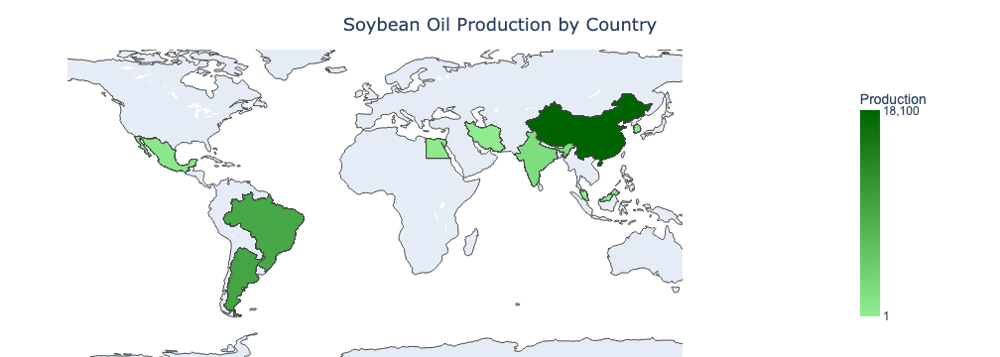

In [25]:
import plotly.express as px


supply_df.columns = supply_df.columns.str.strip()

# Convert 'Production' to numeric 
supply_df['Production'] = pd.to_numeric(supply_df['Production'], errors='coerce')

# Drop rows with missing 'Production' values 
supply_df = supply_df.dropna(subset=['Production'])

# Define a custom color scale from dark green to light green
color_scale = [
    [0, 'lightgreen'],  
    [1, 'darkgreen']  
]

# Create the choropleth map
fig = px.choropleth(
    supply_df,
    locations='Country-Region',
    locationmode='country names',
    color='Production',
    color_continuous_scale=color_scale,
    title='Soybean Oil Production by Country'
)

# Adjust the layout
fig.update_layout(
    title={
        'text': "Soybean Oil Production by Country",
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 18}
    },
    geo=dict(
        projection_scale=1.2,  
        center={"lat": 0, "lon": 0},
        showframe=False,
        showcoastlines=True,
        domain=dict(x=[0, 0.75])  
    ),
    coloraxis_colorbar=dict(
        title="Production",
        title_font=dict(size=14, family="Arial"),  
        tickfont=dict(size=12, family="Arial"),  
        thickness=20,  
        len=0.8,  
        xanchor="left",
        x=0.85,  
        yanchor="middle",
        y=0.5,
        tickvals=[supply_df['Production'].min(), supply_df['Production'].max()],
        ticktext=[
            f'{supply_df["Production"].min():,.0f}', 
            f'{supply_df["Production"].max():,.0f}'
        ]  # Correctly formatted f-strings
    ),
    margin={"r": 0, "t": 50, "l": 0, "b": 0}  
)

fig.show()


In [26]:
import plotly.graph_objects as go

from IPython.display import display, HTML


# Convert 'Exports' to numeric
supply_df['Exports'] = pd.to_numeric(supply_df['Exports'], errors='coerce')

# Drop rows with missing 'Exports' 
supply_df = supply_df.dropna(subset=['Exports'])

# Sort the DataFrame by Exports for better visual representation
supply_df = supply_df.sort_values(by='Exports', ascending=False)

# Define the data
labels = supply_df['Country-Region']
sizes = supply_df['Exports']

# Create a 3D pie chart using Plotly
fig = go.Figure(data=[go.Pie(labels=labels, values=sizes, hole=0.3)])

fig.update_layout(
    title_text='Soybean Oil Exports by Country',
    title_font_size=24,
    title_x=0.5,  # Center the title
    width=800,   
    height=600,   
    margin=dict(l=0, r=0, t=50, b=0),  
)

# Center the plot using HTML
html_output = f"<div style='display: flex; justify-content: center;'><div style='width: 800px;'>{fig.to_html(full_html=False)}</div></div>"

# Display the centered plot
display(HTML(html_output))


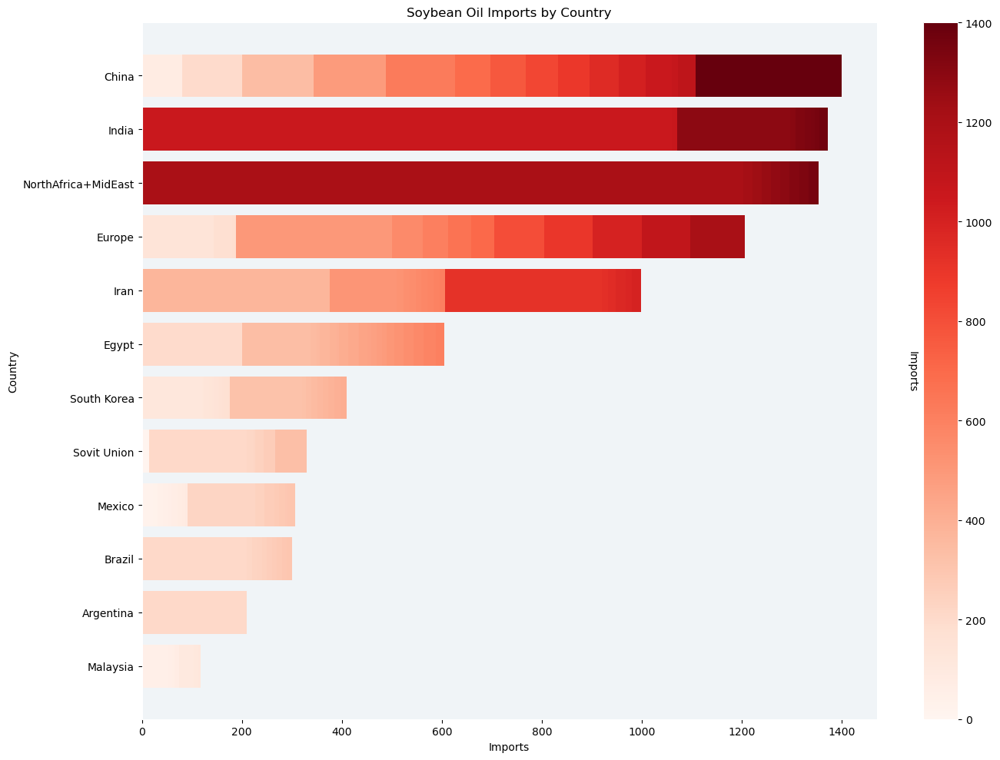

In [27]:
# Convert 'Imports' to numeric
supply_df['Imports'] = pd.to_numeric(supply_df['Imports'], errors='coerce')

# Drop rows with missing 'Imports' value
supply_df = supply_df.dropna(subset=['Imports'])

# Sort the DataFrame by Imports in descending order
supply_df = supply_df.sort_values(by='Imports', ascending=False)

# Create a color gradient based on Imports values
norm = plt.Normalize(vmin=supply_df['Imports'].min(), vmax=supply_df['Imports'].max())
cmap = plt.get_cmap('Reds')  
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Create the horizontal bar plot
plt.figure(figsize=(14, 10)) 

bars = plt.barh(
    supply_df['Country-Region'],
    supply_df['Imports'],
    color=[cmap(norm(value)) for value in supply_df['Imports']]
)

cbar = plt.colorbar(sm)
cbar.set_label('Imports', rotation=270, labelpad=15)
cbar.ax.yaxis.set_label_position('left')


plt.xlabel('Imports')
plt.ylabel('Country')
plt.title('Soybean Oil Imports by Country')


plt.gca().invert_yaxis()

plt.tight_layout()


plt.show()


<div style="background-color: #B8860B ; color: #e6f7ff ; padding: 20px; border-radius: 10px;">
  <h3>Based on the results from the previous plots, we can conclude that China, as the largest producer and importer, plays a central role in supply-demand dynamics. Changes in its production levels can affect global supply and prices—higher production may reduce prices if demand remains stable, while lower production can increase prices.
<h3>Argentina and Brazil are major exporters, and their export volumes impact global supply. Increased exports from these countries can lower global prices by boosting supply, while reduced exports can tighten the market and drive prices up.
<h3>Import patterns in major consuming regions, including China, India, North Africa, the Middle East, and Europe, also affect global prices. Rising imports in these regions can lead to higher prices if production and exports do not keep up with the increased demand. Conversely, decreased imports can signal lower demand and potentially reduce prices.
<h3>To forecast soybean oil prices accurately, it is crucial to monitor production levels in China, export trends from Argentina and Brazil, and import patterns in key consuming regions. These factors are vital for understanding market dynamics and price movements.
</div>

<div style="background-color: #DAA520; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>1.5  Include Global Supply-Demand Data</h2>
</div>      


In [28]:
# Calculate global supply_demand

#numeric columns are converted to numeric types
numeric_columns = ['Crush', 'ExtractRate', 'Production', 'Imports', 
                   'Exports', 'Total-Cons', 'Food-Use',  
                   'Ending-stock']

supply_df[numeric_columns] = supply_df[numeric_columns].apply(pd.to_numeric, errors='coerce')


global_trends_df = supply_df.groupby('year').agg({
    'Crush': 'sum',
    'ExtractRate': lambda x: (x * supply_df.loc[x.index, 'Production']).sum() / supply_df.loc[x.index, 'Production'].sum(),
    'Production': 'sum',
    'Imports': 'sum',
    'Exports': 'sum',
    'Total-Cons': 'sum',
    'Food-Use': 'sum',
    'Ending-stock': 'mean'  
}).reset_index()





global_trends_df.head()

,year,Crush,ExtractRate,Production,Imports,Exports,Total-Cons,Food-Use,Ending-stock
0,2000,2024.866,5.985862,2450.775,2356.416,471.750,3105.729,2945.433,62.000000
1,2001,2426.045,7.237609,2673.535,2750.434,472.890,3467.463,3283.150,63.454545
2,2002,2294.148,8.353584,2657.371,2834.499,479.681,3597.442,3433.143,97.818182
3,2003,2735.301,8.159018,2824.366,3014.552,591.817,2617.531,2454.227,99.250000
4,2004,2840.807,8.164299,2918.253,3184.609,602.123,2570.489,2407.177,107.250000


In [29]:
# Ensure 'Date' column is in datetime format
price_tech_df['Date'] = pd.to_datetime(price_tech_df['Date'])


In [30]:
price_tech_df['year'] = price_tech_df['Date'].dt.year



In [31]:
# Merge the DataFrames
price_tech_supply_df = pd.merge(price_tech_df, global_trends_df , on='year', how='left')
price_tech_supply_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5411 entries, 0 to 5410
Data columns (total 26 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          5411 non-null   datetime64[ns]
 1   Open          5411 non-null   float64       
 2   High          5411 non-null   float64       
 3   Low           5411 non-null   float64       
 4   Close         5411 non-null   float64       
 5   Adj Close     5411 non-null   float64       
 6   Volume        5411 non-null   float64       
 7   SMA           5411 non-null   float64       
 8   EMA           5411 non-null   float64       
 9   RSI           5411 non-null   float64       
 10  BBL_20_2.0    5411 non-null   float64       
 11  BBM_20_2.0    5411 non-null   float64       
 12  BBU_20_2.0    5411 non-null   float64       
 13  MACD          5411 non-null   float64       
 14  MACD_signal   5411 non-null   float64       
 15  MACD_hist     5411 non-null   float64 

<div style="background-color: #DAA520 ; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>1.6 Include Macro-economic Data</h2>
</div>

In [32]:
mac_df = pd.read_csv("world-macroeconomy.csv", sep=';', engine='python')
mac_df.head(10)

,year,GDP,GDP Growth,Inflation-Deflator,Inflation-ConsumerPrice
0,2000,"3,38394E+13","4,531094789","5,424434327","3,433515634"
1,2001,"3,38394E+13","2,025402869","3,846153846","3,836572621"
2,2002,"3,38394E+13","2,302836989","3,647476271","2,90799857"
3,2003,"3,38394E+13","3,104275673","3,933503339","3,025045263"
4,2004,"3,38394E+13","4,469258855","5,629328294","3,517999031"
5,2005,"3,38394E+13","4,00586591","5,781251843","4,107250707"
6,2006,"3,38394E+13","4,442792696","5,510095287","4,267174634"
7,2007,"3,38394E+13","4,37327669","5,846892312","4,810237043"
8,2008,"3,38394E+13","2,062495933","7,849030377","8,949953354"
9,2009,"3,38394E+13","-1,355782091","2,332361516","2,860448559"


In [33]:
missing_values = mac_df.isna().sum()
print(missing_values)

year                       0
GDP                        0
GDP Growth                 0
Inflation-Deflator         0
Inflation-ConsumerPrice    0
dtype: int64


In [34]:
# Convert 'year' columns to int64
price_tech_supply_df['year'] = price_tech_supply_df['year'].astype('int64')
mac_df['year'] = mac_df['year'].astype('int64')


In [35]:
# Merge on 'year', using 'left' to include all rows from price_tech_df
price_tech_supply_mac_df = pd.merge(price_tech_supply_df, mac_df, on='year', how='left')


In [36]:
price_tech_supply_mac_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5411 entries, 0 to 5410
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Date                     5411 non-null   datetime64[ns]
 1   Open                     5411 non-null   float64       
 2   High                     5411 non-null   float64       
 3   Low                      5411 non-null   float64       
 4   Close                    5411 non-null   float64       
 5   Adj Close                5411 non-null   float64       
 6   Volume                   5411 non-null   float64       
 7   SMA                      5411 non-null   float64       
 8   EMA                      5411 non-null   float64       
 9   RSI                      5411 non-null   float64       
 10  BBL_20_2.0               5411 non-null   float64       
 11  BBM_20_2.0               5411 non-null   float64       
 12  BBU_20_2.0               5411 non-

<div style="background-color: #B8860B ; color: #e6f7ff ; padding: 20px; border-radius: 10px;">
  <h3>We now have comprehensive data with almost all relevant features included to ensure robust predictions. We can also consider incorporating geopolitical, market sentiment, and weather-related data to further enhance the accuracy of our predictions. However, given the time constraints and limited access to these additional data sources, we will train our predictive model using the current features that directly affect oil prices.
</h3>
</div>

<div style="background-color:  #B8860B ; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>Step 2 | Data Cleaning and Exploratory Data Analysis</h2>
</div>


<div style="background-color: #DAA520; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>2.1  Data Cleaning </h2>
</div>

In [37]:
print(price_tech_supply_mac_df.isna().sum())



Date                       0
Open                       0
High                       0
Low                        0
Close                      0
Adj Close                  0
Volume                     0
SMA                        0
EMA                        0
RSI                        0
BBL_20_2.0                 0
BBM_20_2.0                 0
BBU_20_2.0                 0
MACD                       0
MACD_signal                0
MACD_hist                  0
OBV                        0
year                       0
Crush                      0
ExtractRate                0
Production                 0
Imports                    0
Exports                    0
Total-Cons                 0
Food-Use                   0
Ending-stock               0
GDP                        0
GDP Growth                 0
Inflation-Deflator         0
Inflation-ConsumerPrice    0
dtype: int64


In [38]:
# Check for duplicates in the 'Date' column
duplicates_by_date = price_tech_supply_mac_df['Date'].duplicated()

# Count the number of duplicate rows based on the 'Date' column
num_duplicates = duplicates_by_date.sum()

print("Number of duplicate rows based on 'Date' column:", num_duplicates)


Number of duplicate rows based on 'Date' column: 0


In [39]:
price_tech_supply_mac_df.columns = price_tech_supply_mac_df.columns.str.strip()


In [40]:
price_tech_supply_mac_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,SMA,EMA,RSI,...,Production,Imports,Exports,Total-Cons,Food-Use,Ending-stock,GDP,GDP Growth,Inflation-Deflator,Inflation-ConsumerPrice
0,2000-03-15,17.049999,17.129999,16.809999,16.850000,16.850000,11147.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,"3,38394E+13","4,531094789","5,424434327","3,433515634"
1,2000-03-16,16.790001,17.219999,16.639999,16.940001,16.940001,12610.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,"3,38394E+13","4,531094789","5,424434327","3,433515634"
2,2000-03-17,17.100000,17.900000,17.000000,17.850000,17.850000,24579.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,"3,38394E+13","4,531094789","5,424434327","3,433515634"
3,2000-03-20,17.500000,17.600000,17.260000,17.459999,17.459999,10960.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,"3,38394E+13","4,531094789","5,424434327","3,433515634"
4,2000-03-21,17.430000,17.459999,17.219999,17.270000,17.270000,8102.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,"3,38394E+13","4,531094789","5,424434327","3,433515634"


In [41]:
# Columns that need cleaning
columns_to_clean = ['GDP', 'GDP Growth', 'Inflation-Deflator', 'Inflation-ConsumerPrice']

# Replace commas with dots and convert to float
for col in columns_to_clean:
    price_tech_supply_mac_df[col] = price_tech_supply_mac_df[col].str.replace(',', '.').astype(float)

# Verify conversion
print(price_tech_supply_mac_df[columns_to_clean].dtypes)
print(price_tech_supply_mac_df[columns_to_clean].head())


GDP                        float64
GDP Growth                 float64
Inflation-Deflator         float64
Inflation-ConsumerPrice    float64
dtype: object
            GDP  GDP Growth  Inflation-Deflator  Inflation-ConsumerPrice
0  3.383940e+13    4.531095            5.424434                 3.433516
1  3.383940e+13    4.531095            5.424434                 3.433516
2  3.383940e+13    4.531095            5.424434                 3.433516
3  3.383940e+13    4.531095            5.424434                 3.433516
4  3.383940e+13    4.531095            5.424434                 3.433516


In [42]:
price_tech_supply_mac_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,SMA,EMA,RSI,...,Production,Imports,Exports,Total-Cons,Food-Use,Ending-stock,GDP,GDP Growth,Inflation-Deflator,Inflation-ConsumerPrice
0,2000-03-15,17.049999,17.129999,16.809999,16.850000,16.850000,11147.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
1,2000-03-16,16.790001,17.219999,16.639999,16.940001,16.940001,12610.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
2,2000-03-17,17.100000,17.900000,17.000000,17.850000,17.850000,24579.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
3,2000-03-20,17.500000,17.600000,17.260000,17.459999,17.459999,10960.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
4,2000-03-21,17.430000,17.459999,17.219999,17.270000,17.270000,8102.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516


In [43]:
price_tech_supply_mac_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5411 entries, 0 to 5410
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Date                     5411 non-null   datetime64[ns]
 1   Open                     5411 non-null   float64       
 2   High                     5411 non-null   float64       
 3   Low                      5411 non-null   float64       
 4   Close                    5411 non-null   float64       
 5   Adj Close                5411 non-null   float64       
 6   Volume                   5411 non-null   float64       
 7   SMA                      5411 non-null   float64       
 8   EMA                      5411 non-null   float64       
 9   RSI                      5411 non-null   float64       
 10  BBL_20_2.0               5411 non-null   float64       
 11  BBM_20_2.0               5411 non-null   float64       
 12  BBU_20_2.0               5411 non-

In [44]:
price_tech_supply_mac_df.to_csv('merged_dataframe.csv', index=False)


<div style="background-color: #DAA520; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>2.2 Exploratory DataAnalyse </h2>
</div>

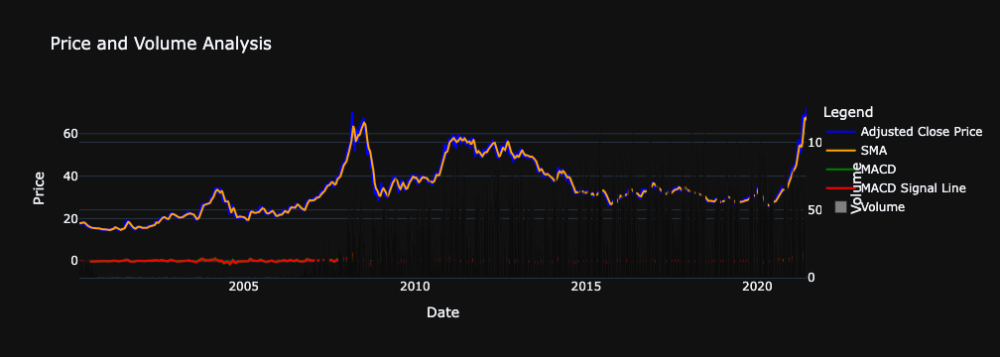

In [45]:
# Plot Adjusted Close Price, SMA, MACD, and Volume in a Plotly interactive chart
fig = go.Figure()

# Adjusted Close Price
fig.add_trace(go.Scatter(x=price_tech_supply_mac_df['Date'], y=price_tech_supply_mac_df['Adj Close'], mode='lines', name='Adjusted Close Price', line=dict(color='blue')))

# SMA
fig.add_trace(go.Scatter(x=price_tech_supply_mac_df['Date'], y=price_tech_supply_mac_df['SMA'], mode='lines', name='SMA', line=dict(color='orange')))

# MACD
fig.add_trace(go.Scatter(x=price_tech_supply_mac_df['Date'], y=price_tech_supply_mac_df['MACD'], mode='lines', name='MACD', line=dict(color='green')))

# MACD Signal Line
fig.add_trace(go.Scatter(x=price_tech_supply_mac_df['Date'], y=price_tech_supply_mac_df['MACD_signal'], mode='lines', name='MACD Signal Line', line=dict(color='red')))

# Volume as bar chart
fig.add_trace(go.Bar(x=price_tech_supply_mac_df['Date'], y=price_tech_supply_mac_df['Volume'], name='Volume', marker_color='gray', yaxis='y2'))

fig.update_layout(
    title='Price and Volume Analysis',
    xaxis_title='Date',
    yaxis_title='Price',
    yaxis2=dict(
        title='Volume',
        overlaying='y',
        side='right'
    ),
    legend_title='Legend',
    template='plotly_dark'
)

fig.show()

<div style="background-color: #B8860B ; color: #e6f7ff ; padding: 20px; border-radius: 10px;">
  <h3>In the previous interactive plot, we presented relationships between price, SMA, MACD, and volume, providing a multidimensional view of a stock’s performance. The adjusted close price shows daily variations, while the SMA smooths these fluctuations to indicate long-term trends. The MACD and its signal line help identify momentum and potential buy/sell signals. Volume indicates the level of trading activity, offering insights into market participation and interest. Analyzing the relationship between the close price and SMA over time highlights major peaks and troughs, with the SMA signaling long-term trends. Crossovers can indicate potential entry or exit points, and the sharp rise at the end suggests a strong upward trend. 
      
<h3>Adding MACD and volume provides deeper insights into the stock’s dynamics. The MACD shows momentum shifts that aren't immediately visible through price trends alone. Crossovers between the MACD and its signal line often signify potential buy or sell opportunities, allowing investors to anticipate changes earlier.
Volume complements these signals by indicating market engagement. High trading volume during significant price changes or MACD crossovers suggests strong investor interest, reinforcing the trend. Conversely, low volume might indicate weaker support. For investors, especially in volatile markets like oil, understanding the interplay between these elements allows for more informed decisions, helping to identify opportune moments for action and manage risks effectively.
</h3>
</div>

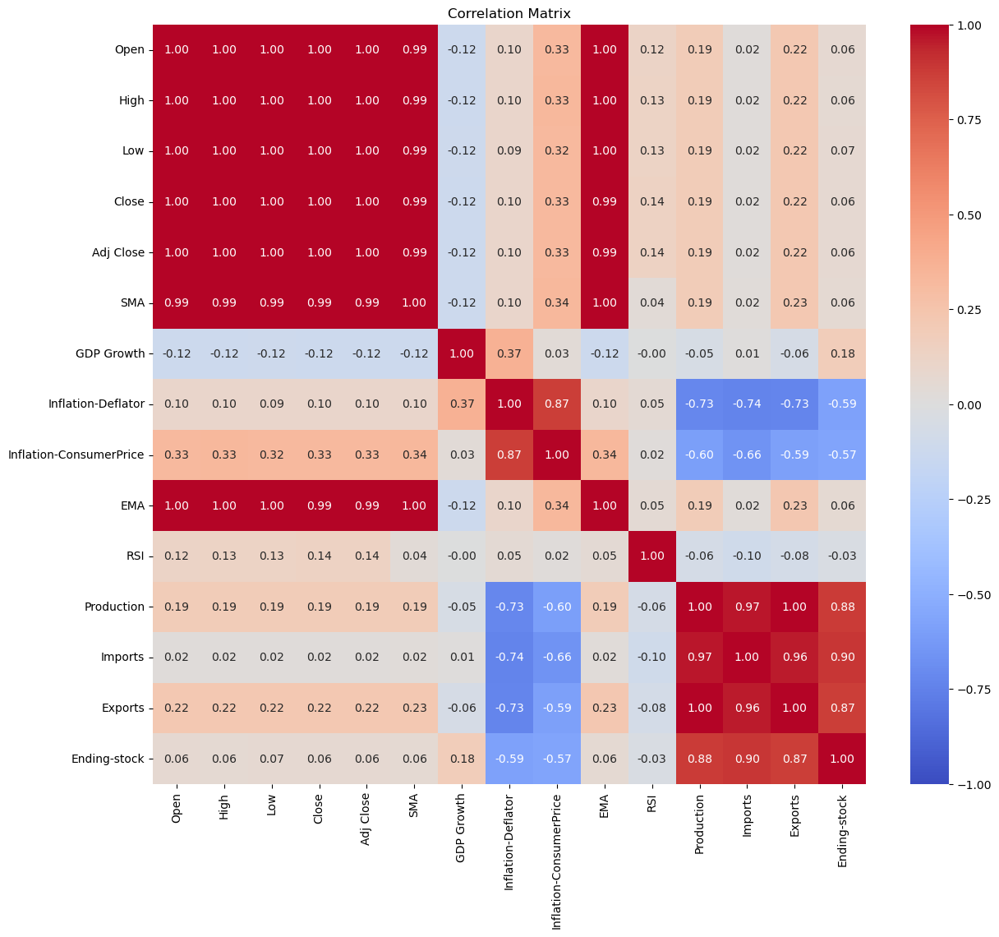

In [68]:
# List of features to include in the correlation matrix
correlation_features = ['Open', 'High', 'Low', 'Close', 'Adj Close','SMA',                       
                        'GDP Growth', 'Inflation-Deflator','Inflation-ConsumerPrice', 
                        'EMA', 'RSI', 'Production', 'Imports', 'Exports', 'Ending-stock', 
                        ]

# Compute the correlation matrix
correlation_matrix = price_tech_supply_mac_df[correlation_features].corr()

# Plot the correlation matrix
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()




<div style="background-color: #B8860B ; color: #e6f7ff ; padding: 20px; border-radius: 10px;">
  <h3>Price indicators (Open, High, Low, Close, Adj Close) are highly correlated with each other, as well as with the SMA and EMA. This suggests that as one price metric changes, others tend to move similarly due to their intrinsic relationship in capturing stock prices over different periods. This strong correlation indicates that the SMA and EMA can effectively reflect and predict price movements.

<h3>Production, Imports, and Exports show moderate correlations with price indicators. This suggests that changes in supply-related metrics might influence price movements, possibly due to their impact on the broader economic environment or specific supply-demand dynamics.

<h3>RSI, being a momentum indicator, shows weaker correlations, indicating that while it reflects market momentum, it's less directly tied to price levels than moving averages or supply metrics. This reinforces the role of RSI as more of a supplementary tool for assessing potential overbought or oversold conditions rather than directly impacting price.

<h3>Ending-stock shows low correlation with price indicators, indicating its limited direct impact on price within this dataset.

<h3>Overall, supply-related metrics like Production, Imports, and Exports, along with moving averages (SMA, EMA), appear to have a more meaningful relationship with price, suggesting that changes in supply dynamics and technical trends could influence price movements.
</h3>
</div>

<div style="background-color:  #B8860B ; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>Step 3 | Data Preprocessing and Model Training </h2>
</div>

<div style="background-color: #DAA520; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>3.1 Data Preprocessing </h2>
</div>

In [47]:
df = pd.read_csv("merged_dataframe.csv")
df.head(10)

,Date,Open,High,Low,Close,Adj Close,Volume,SMA,EMA,RSI,...,Production,Imports,Exports,Total-Cons,Food-Use,Ending-stock,GDP,GDP Growth,Inflation-Deflator,Inflation-ConsumerPrice
0,2000-03-15,17.049999,17.129999,16.809999,16.850000,16.850000,11147.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
1,2000-03-16,16.790001,17.219999,16.639999,16.940001,16.940001,12610.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
2,2000-03-17,17.100000,17.900000,17.000000,17.850000,17.850000,24579.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
3,2000-03-20,17.500000,17.600000,17.260000,17.459999,17.459999,10960.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
4,2000-03-21,17.430000,17.459999,17.219999,17.270000,17.270000,8102.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
5,2000-03-22,17.370001,17.580000,17.350000,17.500000,17.500000,13603.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
6,2000-03-23,17.450001,17.459999,17.080000,17.160000,17.160000,11334.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
7,2000-03-24,17.139999,17.500000,17.000000,17.400000,17.400000,7382.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
8,2000-03-27,17.350000,17.700001,17.350000,17.600000,17.600000,5908.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516
9,2000-03-28,17.600000,17.700001,17.459999,17.500000,17.500000,7022.0,17.7115,17.7115,71.356821,...,2450.775,2356.416,471.75,3105.729,2945.433,62.0,3.383940e+13,4.531095,5.424434,3.433516


In [48]:
#convert date ad datetime
df['Date'] = pd.to_datetime(df['Date'])
df.sort_values(by='Date', ascending=True, inplace=True)
df.reset_index(drop=True, inplace=True)

In [49]:
NumCols = df.columns.drop(['Date'])
df[NumCols] = df[NumCols].replace({',': ''}, regex=True)
df[NumCols] = df[NumCols].astype('float64')

In [50]:
# Rename the 'Adj Close' column to 'Price'
df.rename(columns={'Adj Close': 'Price'}, inplace=True)

In [51]:
#split the data to test-train data
test_size = df[df.Date.dt.year==2021].shape[0]
test_size

109

In [52]:
#scale data using min-max scaler
scaler = MinMaxScaler()
scaler.fit(df.Price.values.reshape(-1,1))

MinMaxScaler()

In [53]:
window_size = 60

In [54]:
train_data = df.Price[:-test_size]
train_data = scaler.transform(train_data.values.reshape(-1,1))

In [55]:
X_train = []
y_train = []

for i in range(window_size, len(train_data)):
    X_train.append(train_data[i-60:i, 0])
    y_train.append(train_data[i, 0])

In [56]:
test_data = df.Price[-test_size-60:]
test_data = scaler.transform(test_data.values.reshape(-1,1))

In [57]:
X_test = []
y_test = []

for i in range(window_size, len(test_data)):
    X_test.append(test_data[i-60:i, 0])
    y_test.append(test_data[i, 0])

In [58]:
X_train = np.array(X_train)
X_test  = np.array(X_test)
y_train = np.array(y_train)
y_test  = np.array(y_test)

In [59]:
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test  = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
y_train = np.reshape(y_train, (-1,1))
y_test  = np.reshape(y_test, (-1,1))

In [60]:
print('X_train Shape: ', X_train.shape)
print('y_train Shape: ', y_train.shape)
print('X_test Shape:  ', X_test.shape)
print('y_test Shape:  ', y_test.shape)

X_train Shape:  (5242, 60, 1)
y_train Shape:  (5242, 1)
X_test Shape:   (109, 60, 1)
y_test Shape:   (109, 1)


<div style="background-color: #DAA520; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>3.2 Model Training </h2>
</div>

In [61]:
def define_model():
    input1 = Input(shape=(window_size,1))
    x = LSTM(units = 64, return_sequences=True)(input1)  
    x = Dropout(0.2)(x)
    x = LSTM(units = 64, return_sequences=True)(x)
    x = Dropout(0.2)(x)
    x = LSTM(units = 64)(x)
    x = Dropout(0.2)(x)
    x = Dense(32, activation='softmax')(x)
    dnn_output = Dense(1)(x)

    model = Model(inputs=input1, outputs=[dnn_output])
    model.compile(loss='mean_squared_error', optimizer='Nadam')
    model.summary()
    
    return model

In [62]:
model = define_model()
history = model.fit(X_train, y_train, epochs=52, batch_size=32, validation_split=0.1, verbose=1)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 60, 1)]           0         
                                                                 
 lstm (LSTM)                 (None, 60, 64)            16896     
                                                                 
 dropout (Dropout)           (None, 60, 64)            0         
                                                                 
 lstm_1 (LSTM)               (None, 60, 64)            33024     
                                                                 
 dropout_1 (Dropout)         (None, 60, 64)            0         
                                                                 
 lstm_2 (LSTM)               (None, 64)                33024     
                                                                 
 dropout_2 (Dropout)         (None, 64)                0     

In [63]:
result = model.evaluate(X_test, y_test)
y_pred = model.predict(X_test) 

4/4 [==============================] - 1s 13ms/step


In [64]:
MAPE = mean_absolute_percentage_error(y_test, y_pred)
Accuracy = 1 - MAPE

<div style="background-color: #DAA520; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2>3.3 Present The Result </h2>
</div>

In [65]:
accuracy_percentage = Accuracy * 100


print("Test Loss:", result)
print("Test MAPE:", MAPE)
print(f"Test Accuracy: {accuracy_percentage:.2f}%")

Test Loss: 0.0008817784837447107
Test MAPE: 0.028826792352361394
Test Accuracy: 97.12%


<div style="background-color:  #B8860B ; color: #e6f7ff; padding: 20px; border-radius: 10px;">
  <h2> The Accuracy Of Model Prediction Is: 97.12 % </h2>
</div>

In [69]:
y_test_true = scaler.inverse_transform(y_test)
y_test_pred = scaler.inverse_transform(y_pred)

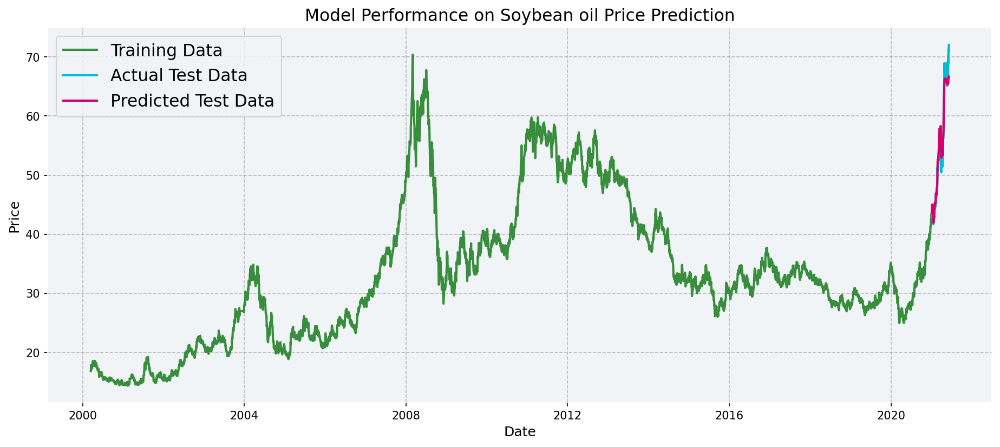

In [70]:
plt.figure(figsize=(15, 6), dpi=150)


plt.rcParams['axes.facecolor'] = '#F0F4F7' 
plt.rcParams['axes.edgecolor'] = 'white' 


plt.plot(df['Date'].iloc[:-test_size], scaler.inverse_transform(train_data), color='#388E3C', lw=2, label='Training Data')  
plt.plot(df['Date'].iloc[-test_size:], y_test_true, color='#00BCD4', lw=2, label='Actual Test Data')  
plt.plot(df['Date'].iloc[-test_size:], y_test_pred, color='#D5006D', lw=2, label='Predicted Test Data')  


plt.title('Model Performance on Soybean oil Price Prediction', fontsize=15)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Price', fontsize=12)


plt.legend(loc='upper left', prop={'size': 15})
plt.grid(color='gray', linestyle='--', alpha=0.5)  
plt.show()

In [73]:

column_name = 'Adj Close'  


actual_prices = price_tech_supply_mac_df[column_name].iloc[-109:].values 

predicted_prices = y_test_pred.flatten()  


comparison_df = pd.DataFrame({
    'Actual Adjusted Close': actual_prices,
    'Predicted Price': predicted_prices
})


print(comparison_df)

     Actual Adjusted Close  Predicted Price
0                42.930000        43.679405
1                44.360001        43.542820
2                44.389999        44.509205
3                44.349998        45.016949
4                43.759998        45.018463
..                     ...              ...
104              68.849998        66.220299
105              71.339996        66.360802
106              70.830002        66.520760
107              72.080002        66.602516
108              71.589996        66.671425

[109 rows x 2 columns]
